---
title: Credit Card Fraud Prediction
subtitle: 2024W Doing Data Science - Semester Project
title-block-banner: true
date: 2025-01-10

author:
  - name: Elizaveta Kotikova
  - name: Martyna Janina Kopyta
  - name: Péter Ferenc Gyarmati

execute:
  echo: true
  enabled: false

format:
  html:
    embed-resources: false
    toc: true
    code-fold: true
    theme: lux
---

::: {.content-hidden}

In [1]:
# %load_ext quak

In [2]:
# Standard library imports
from datetime import datetime as dt
import time
import warnings
from typing import Any

# Data manipulation and analysis
import numpy as np
import pandas as pd
import polars as pl
import polars.selectors as cs
import duckdb

# Machine Learning and Statistics
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from scipy.signal import detrend
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
)
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.tree import DecisionTreeClassifier
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tools.sm_exceptions import InterpolationWarning
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, kpss
from umap import UMAP

# LLM & Embeddings
import lancedb
from lancedb.embeddings import get_registry
from lancedb.pydantic import LanceModel, Vector
import nest_asyncio
import pydantic
import pydantic_ai

# Visualization
import altair as alt
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import seaborn as sns

# Jupyter/IPython
from IPython.display import display, Markdown
from tqdm.notebook import tqdm

In [3]:
pio.renderers.default = "notebook"

In [4]:
nest_asyncio.apply()

In [5]:
warnings.filterwarnings("ignore")
alt.data_transformers.enable("vegafusion")

DataTransformerRegistry.enable('vegafusion')

In [6]:
duckdb.execute("""
INSTALL spatial;
LOAD spatial;
""")

:::

# Preface

## Challenge

The problem at hand is credit card fraud prediction. The goal is to develop a model that can accurately identify fraudulent transactions from legitimate ones based on the given dataset. The expected benefits of this project include:

1. Reduced financial losses for credit card companies and cardholders
2. Improved customer trust and satisfaction
3. Enhanced security measures for credit card transactions
4. More efficient allocation of resources for fraud investigation

Fraudulent transactions often stand out due to **unusual patterns** like sudden **large amounts**, **frequent purchases** in quick succession, or transactions originating from **unfamiliar locations**, making fraud detection a complex task. The issue is further complicated by **data imbalance** since fraudulent transactions are much rarer than legitimate ones. This imbalance needs careful management to avoid **bias** in model training. Important features such as **transaction amount**, **location**, **time**, **merchant details**, and **historical customer behavior** are crucial for improving model accuracy. Additionally, any solutions must comply with **data privacy regulations** like GDPR, which dictate how personal data is managed. The ever-evolving strategies of fraudsters require fraud detection systems to be regularly updated and adapted. Achieving a good balance is essential to minimize **false positives**, which can annoy customers, and **false negatives**, which can cause financial losses, making **precision** and **recall** equally important.

# Data Preparation & Feature Engineering

## Raw Data

The [Credit Card Fraud Prediction dataset](https://www.kaggle.com/datasets/kelvinkelue/credit-card-fraud-prediction) offers a variety of attributes valuable for comprehensive analysis. It contains 555,719 instances and 22 attributes, a mix of categorical and numerical data types. Importantly, the dataset is complete with no null values. Below is a breakdown of the attributes.

| Field | Description |
|-------|-------------|
| `trans_date_trans_time` | Transaction date and time |
| `cc_num` | Unique customer identification number |
| `merchant` | The merchant involved in the transaction |
| `category` | Transaction type (e.g., personal, childcare) |
| `amt` | Transaction amount |
| `first` | Cardholder's first name |
| `last` | Cardholder's last name |
| `gender` | Cardholder's gender |
| `street` | Cardholder's street address |
| `city` | Cardholder's city of residence |
| `state` | Cardholder's state of residence |
| `zip` | Cardholder's zip code |
| `lat` | Latitude of cardholder's location |
| `long` | Longitude of cardholder's location |
| `city_pop` | Population of the cardholder's city |
| `job` | Cardholder's job title |
| `dob` | Cardholder's date of birth |
| `trans_num` | Unique transaction identifier |
| `unix_time` | Transaction timestamp (Unix format) |
| `merch_lat` | Merchant's location (latitude) |
| `merch_long` | Merchant's location (longitude) |
| `is_fraud` | Fraudulent transaction indicator (1 = fraud, 0 = legitimate). This is the target variable for classification purposes |

In [7]:
df = pl.read_parquet(
    "https://static.observableusercontent.com/files/0c983ad1caf659294dd85e959588d9825cb271e6e18fd9db311a54b6032eea6b3cbbfccc678c19934e57cfcbb3e98831c5ed879ef19b6163c63e9717da509163"
)
df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
i64,str,f64,str,str,f64,str,str,str,str,str,str,i64,f64,f64,i64,str,str,str,i64,f64,f64,i64
0,"""21/06/2020 12:14""",2.2912e15,"""fraud_Kirlin and Sons""","""personal_care""",2.86,"""Jeff""","""Elliott""","""M""","""351 Darlene Green""","""Columbia""","""SC""",29209,33.9659,-80.9355,333497,"""Mechanical engineer""","""19/03/1968""","""2da90c7d74bd46a0caf3777415b3eb…",1371816865,33.986391,-81.200714,0
1,"""21/06/2020 12:14""",3.5730e15,"""fraud_Sporer-Keebler""","""personal_care""",29.84,"""Joanne""","""Williams""","""F""","""3638 Marsh Union""","""Altonah""","""UT""",84002,40.3207,-110.436,302,"""Sales professional, IT""","""17/01/1990""","""324cc204407e99f51b0d6ca0055005…",1371816873,39.450498,-109.960431,0
2,"""21/06/2020 12:14""",3.5982e15,"""fraud_Swaniawski, Nitzsche and…","""health_fitness""",41.28,"""Ashley""","""Lopez""","""F""","""9333 Valentine Point""","""Bellmore""","""NY""",11710,40.6729,-73.5365,34496,"""Librarian, public""","""21/10/1970""","""c81755dbbbea9d5c77f094348a7579…",1371816893,40.49581,-74.196111,0
3,"""21/06/2020 12:15""",3.5919e15,"""fraud_Haley Group""","""misc_pos""",60.05,"""Brian""","""Williams""","""M""","""32941 Krystal Mill Apt. 552""","""Titusville""","""FL""",32780,28.5697,-80.8191,54767,"""Set designer""","""25/07/1987""","""2159175b9efe66dc301f149d3d5abf…",1371816915,28.812398,-80.883061,0
4,"""21/06/2020 12:15""",3.5268e15,"""fraud_Johnston-Casper""","""travel""",3.19,"""Nathan""","""Massey""","""M""","""5783 Evan Roads Apt. 465""","""Falmouth""","""MI""",49632,44.2529,-85.017,1126,"""Furniture designer""","""06/07/1955""","""57ff021bd3f328f8738bb535c302a3…",1371816917,44.959148,-85.884734,0


## Feature Engineering

For easier downstream processing and analysis, we convert `is_fraud` and `gender` to boolean variables.

In [8]:
is_fraud = pl.col("is_fraud").cast(pl.Boolean)
# Encode Male as False (0), Female as True (1)
gender = (pl.col("gender") == "F").cast(pl.Boolean)

### Transaction Date and Time

The `trans_date_trans_time` feature can be transformed to extract meaningful temporal information.
Fraudulent transactions may occur at unusual times or exhibit different patterns compared to legitimate ones. Therefore, we extract the following features:

- `tx_datetime`: Typed datetime object for the transaction timestamp which is represented as string in the raw data.
- `tx_hour`: Time of day when the transaction occurred.
- `tx_day_of_week`: To capture weekly patterns.
- `tx_is_weekend`: Boolean indicating if the transaction occurred on a weekend.

In [9]:
tx_datetime = pl.col("trans_date_trans_time").str.to_datetime("%d/%m/%Y %H:%M")
tx_hour = tx_datetime.dt.hour()
tx_day_of_week = tx_datetime.dt.weekday()
tx_is_weekend = tx_datetime.dt.weekday() > 5

In [10]:
df.select(
    "",
    tx_datetime=tx_datetime,
    tx_hour=tx_hour,
    tx_day_of_week=tx_day_of_week,
    tx_is_weekend=tx_is_weekend,
    is_fraud=is_fraud,
).head()

,tx_datetime,tx_hour,tx_day_of_week,tx_is_weekend,is_fraud
i64,datetime[μs],i8,i8,bool,bool
0,2020-06-21 12:14:00,12,7,true,false
1,2020-06-21 12:14:00,12,7,true,false
2,2020-06-21 12:14:00,12,7,true,false
3,2020-06-21 12:15:00,12,7,true,false
4,2020-06-21 12:15:00,12,7,true,false


### Customer Identification Number

As a unique identifier of the credit card holder, `cc_num` doesn't provide value for telling fraudulent transactions apart from legitimate ones. However, it can be used to engineer features that capture card-holder-specific behavior. We create the following features:

- `is_frequently_visited_merchant`: Boolean indicating if the cardholder frequently visits the same merchant, where "frequent" is defined as more than 2 transactions with the same merchant.
- `amt_median`: Median transaction amount for the cardholder at the given merchant. Allows us to compute the deviation of each transaction at a merchant from the cardholder's typical spending behavior at that merchant.

In [11]:
cc_num_merchant_agg_df = df.group_by("cc_num", "merchant").agg(
    is_frequently_visited_merchant=pl.len() > 2,
    amt_median=pl.col("amt").median(),
    # The given customer fell victim to fraud this many times
    num_frauds_suffered=pl.sum("is_fraud"),
)
cc_num_merchant_agg_df.head()

cc_num,merchant,is_frequently_visited_merchant,amt_median,num_frauds_suffered
f64,str,bool,f64,i64
4.4495e15,"""fraud_Hyatt, Russel and Gleich…",false,67.705,0
5.6540e11,"""fraud_Ruecker-Mayert""",false,49.1,0
3.5893e15,"""fraud_Bins-Rice""",true,50.22,0
4.2479e12,"""fraud_Wiza LLC""",false,3.67,0
4.4811e12,"""fraud_Ernser-Lynch""",false,15.79,0


We join these features to the original dataset on the `cc_num` field.

In [12]:
customer_agg_df = df.join(cc_num_merchant_agg_df, on=["cc_num", "merchant"], how="left")
amt_median = customer_agg_df.get_column("amt_median")
amt_deviation = (pl.col("amt") - amt_median).abs()
is_frequently_visited_merchant = customer_agg_df.get_column(
    "is_frequently_visited_merchant"
)
df.select(
    "",
    amt="amt",
    amt_median=amt_median,
    amt_deviation=amt_deviation,
    is_frequently_visited_merchant=is_frequently_visited_merchant,
    is_fraud=is_fraud,
).head()

,amt,amt_median,amt_deviation,is_frequently_visited_merchant,is_fraud
i64,f64,f64,f64,bool,bool
0,2.86,6.555,3.695,false,false
1,29.84,38.98,9.14,false,false
2,41.28,58.62,17.34,false,false
3,60.05,60.05,0.0,false,false
4,3.19,3.19,0.0,false,false


### Merchant Information

`merchant` is a high-cardinality categorical variable ($693$ unique occurrences) carrying the name of the merchant by which a transaction happened. We could use frequency encoding to transform this feature into a numerical one. However, as already have access to the `category` feature, which provides a more general description of the transaction type, we decide to drop `merchant`, as the category of a transaction in essence is a clustered representation of the merchant.

We use `merch_lat` and `merch_long` to calculate the distance between the merchant and the cardholder. This can be a useful feature, as fraudulent transactions may occur when the merchant is located far from the cardholder. We compute the following features:

- `distance_from_merch`: The spheroid distance between the merchant and the cardholder

In [13]:
coord_df = df.select("", "lat", "long", "merch_lat", "merch_long", is_fraud=is_fraud)
distance_from_merch = (
    duckdb.query("""
SELECT st_distance_spheroid(
    st_point(lat, long),
    st_point(merch_lat, merch_long)
) AS distance_from_merch
FROM coord_df;
""")
    .pl()
    .get_column("distance_from_merch")
)
df.select("", distance_from_merch=distance_from_merch, is_fraud=is_fraud).head()

,distance_from_merch,is_fraud
i64,f64,bool
0,24613.746071,false
1,104834.043428,false
2,59204.795631,false
3,27615.117073,false
4,104423.174625,false


### Transaction Amount

The `amt` feature can be used directly for detecting anomalies in transaction amounts. We perform a logarithmic transformation to normalize the distribution of transaction amounts, to account for the skewed nature of the data (many small, $\leq \$100$, transactions and a few large, $\geq \$1000$, transactions). We create the following features:

- `amt_log`: Logarithm of the transaction amount

In [14]:
amt_log = pl.col("amt").log().alias("amt_log")
df.select("", tx_datetime=tx_datetime, amt="amt", amt_log=amt_log).head()

,tx_datetime,amt,amt_log
i64,datetime[μs],f64,f64
0,2020-06-21 12:14:00,2.86,1.050822
1,2020-06-21 12:14:00,29.84,3.39585
2,2020-06-21 12:14:00,41.28,3.720378
3,2020-06-21 12:15:00,60.05,4.095178
4,2020-06-21 12:15:00,3.19,1.160021


### City Population

`city_pop` may indicate the likelihood of fraud occurring in certain population densities. We create the following feature:

- `city_pop_cat`: Categorical representation of the city population determined based on a threshold to bin populations into categories (e.g., rural, suburban, urban)

Categorizing population sizes into discrete groups like village, town, and city makes the model's results more interpretable and easier to understand for stakeholders1. This classification aligns with how people typically think about settlement sizes, making it simpler to communicate findings and insights.

Also, if the relationship between population size and the target variable is non-linear, discretization can help capture these complex patterns18. For example, there might be distinct differences in certain characteristics between villages, towns, and cities that are not proportional to their population sizes.

In [15]:
city_pop_thresholds = [
    ("hamlet", 0),
    ("village", 500),
    ("town", 2_500),
    ("city", 25_000),
    ("metropolis", 1_000_000),
    ("megalopolis", 5_000_000),
]
city_pop_cat = pl.lit(None).cast(pl.Utf8)
for i, (cat, lower_bound) in enumerate(city_pop_thresholds):
    city_pop_cat = (
        pl.when(pl.col("city_pop") > lower_bound)
        .then(pl.lit(cat))
        .otherwise(city_pop_cat)
    )

df.select("", "city_pop", city_pop_cat=city_pop_cat).head()

,city_pop,city_pop_cat
i64,i64,str
0,333497,"""city"""
1,302,"""hamlet"""
2,34496,"""city"""
3,54767,"""city"""
4,1126,"""village"""


### Cardholder Information

Under the assumption that certain individuals are more likely to be victims of credit card fraud, the attributes we have about the cardholder are likely to have major predictive power. We ignore `first` and `last` name columns, as they are personal identifiers, so inherently not useful for clustering. We encode `gender` as binary variable. We ignore the `street` attribute as it is too granular, but we encode `city`, `state` and `zip` directly. We use `lat` and `long` to calculate the distance between the cardholder and the merchant. Using `dob` and `tx_datetime` we also calculate the age of the cardholder at the time of the transaction.

Furthermore, as the job title of the cardholder may be indicative of their income level, and background in general, it might have a non-negligible predictive power. Therefore, we also want to include this feature in our model. We create the following features:

- `age`: Age of the cardholder at the time of the transaction
- `distance_from_merch`: The distance between the cardholder and the merchant
- `job_group`: Employment group based on the cardholder's job title

In [16]:
dob = pl.col("dob").str.to_datetime("%d/%m/%Y")
age = (tx_datetime.dt.year() - dob.dt.year()).cast(pl.UInt16)
df.select("", tx_datetime=tx_datetime, dob=dob, age=age).head()

,tx_datetime,dob,age
i64,datetime[μs],datetime[μs],u16
0,2020-06-21 12:14:00,1968-03-19 00:00:00,52
1,2020-06-21 12:14:00,1990-01-17 00:00:00,30
2,2020-06-21 12:14:00,1970-10-21 00:00:00,50
3,2020-06-21 12:15:00,1987-07-25 00:00:00,33
4,2020-06-21 12:15:00,1955-07-06 00:00:00,65


#### Job Group

In [17]:
df.select("job").unique().sort("job")

job
str
"""Academic librarian"""
"""Accountant, chartered certifie…"
"""Accountant, chartered public f…"
"""Accounting technician"""
"""Acupuncturist"""
…
"""Water engineer"""
"""Water quality scientist"""
"""Web designer"""


The `job` feature is a high-cardinality categorical variable ($478$ unique occurrences) that can be grouped into more general categories. We group job titles into the following categories:

In [18]:
JOB_GROUPS = [
    "Administrative",
    "Business",
    "Construction",
    "Creative",
    "Customer Service",
    "Engineering",
    "Education",
    "Executive Officer",
    "Finance",
    "Healthcare",
    "Human Resources",
    "Legal",
    "Manufacturing",
    "Retail",
    "Science & Research",
    "Technology",
]
Markdown("\n".join(f"- {job}" for job in JOB_GROUPS))

- Administrative
- Business
- Construction
- Creative
- Customer Service
- Engineering
- Education
- Executive Officer
- Finance
- Healthcare
- Human Resources
- Legal
- Manufacturing
- Retail
- Science & Research
- Technology

To create the `job_group` feature, we employ a combination of techniques. First, we generate text embeddings for each job title using the [nomic-embed-text](https://ollama.com/library/nomic-embed-text) embedding model served locally via the [Ollama platform](https://ollama.com/). These embeddings represent the semantic meaning of the job titles in a high-dimensional space, capturing the nuances and similarities between them. Using these embeddings, we apply the KMeans clustering algorithm to group similar job titles together. This clustering automatically identifies patterns and groups jobs based on their textual similarities, without requiring predefined labels. 

Once clusters are formed, a local large language model, ([Qwen2.5-7B](https://huggingface.co/Qwen/Qwen2.5-7B)) served through Ollama is used to associate each cluster with a predefined job group from our `JOB_GROUPS` list. The model analyzes a sample of job titles from each cluster and determines the most appropriate job category, ensuring that the mapping is both accurate and aligned with industry standards.

For visualization, we reduce the dimensions of the high-dimensional embeddings using UMAP (Uniform Manifold Approximation and Projection). UMAP is preferred over PCA (Principal Component Analysis) because it preserves both the local and global structure of the data more effectively, providing a clearer and more meaningful visualization of the clustered job titles.

In [19]:
def compute_text_embeddings(
    texts: list[str],
    ollama_model_name: str,
    db_path: str,
) -> pl.DataFrame:
    db = lancedb.connect(db_path)
    func = get_registry().get("ollama").create(name=ollama_model_name)

    class Texts(LanceModel):
        text: str = func.SourceField()
        vector: Vector(func.ndims()) = func.VectorField()

    table = db.create_table("jobs", schema=Texts, mode="overwrite")
    table.add([{"text": text} for text in texts])

    return pl.from_arrow(table.to_arrow())


def attach_projections(
    df: pl.DataFrame, vector_col: str = "vector", n_components: int = 2
) -> pl.DataFrame:
    vectors = np.stack(df.to_pandas()[vector_col].values)
    umap = UMAP(n_components=n_components)
    umap.fit(vectors)
    projections = umap.transform(vectors)
    return df.with_columns(
        pl.concat_list(pl.from_numpy(projections)).alias("projection")
    )


def attach_embedding_clusters(
    df: pl.DataFrame,
    vector_col: str,
    n_clusters: int,
    cluster_col: str,
) -> pl.DataFrame:
    vectors = np.stack(df.to_pandas()[vector_col].values)
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(vectors)
    clusters = kmeans.predict(vectors)
    return pl.concat(
        [df, pl.from_numpy(clusters).select(pl.all().alias(cluster_col))],
        how="horizontal",
    )

In [20]:
def create_embeddings_df(
    texts: list[str],
    ollama_model_name: str,
    n_clusters: int,
    vector_col="vector",
    cluster_col: str = "cluster",
    db_path: str = "./db",
) -> pl.DataFrame:
    df = compute_text_embeddings(texts, ollama_model_name, db_path)
    df = attach_projections(df, vector_col=vector_col)
    df = attach_embedding_clusters(
        df, vector_col=vector_col, n_clusters=n_clusters, cluster_col=cluster_col
    )
    return df

The table below shows that each unique job title is represented by a $768$-dimensional embedding vector generated by `nomic-embed-text`. The `cluster` column indicates the cluster to which each job title belongs, and the `projection` column is a two-dimensional representation of the embeddings obtained using UMAP.

Note that `cluster` is not easy to interpret at this point, as it is just an unsigned integer.

In [21]:
job_embeddings_df = create_embeddings_df(
    texts=df.select("job").unique().sort("job").to_numpy()[:, 0].tolist(),
    ollama_model_name="nomic-embed-text:latest",
    n_clusters=len(JOB_GROUPS),
)
job_embeddings_df.head()

text,vector,projection,cluster
str,"array[f32, 768]",list[f32],i32
"""Academic librarian""","[0.26547, 0.280935, … -0.004296]","[4.226776, 5.559864]",5
"""Accountant, chartered certifie…","[0.87898, 0.322802, … -0.379365]","[2.511942, 6.994193]",14
"""Accountant, chartered public f…","[0.514177, 1.027602, … -0.454598]","[2.544502, 6.939679]",14
"""Accounting technician""","[-0.704875, -0.152066, … 0.03728]","[3.773303, 8.462965]",14
"""Acupuncturist""","[-0.645697, 1.112366, … -0.836398]","[5.401, 7.268549]",4


In [22]:
samples = (
    job_embeddings_df.group_by("cluster")
    .agg("text")
    .select(
        "cluster",
        sample=pl.col("text").list.sample(
            pl.min_horizontal(pl.lit(50), pl.col("text").list.len())
        ),
    )
    .sort("cluster")
    .get_column("sample")
    .to_numpy()
    .squeeze()
)

In [23]:
def infer_cluster_names(
    cluster_samples: list[dict], model: str = "ollama:qwen2.5:7b"
) -> list[str]:
    names: list[str] = []

    class JobGroup(pydantic.BaseModel):
        name: str

    agent = pydantic_ai.Agent(model, result_type=JobGroup)
    for sample in tqdm(
        cluster_samples, desc=f"Inferring Job Group Names using LLM {model}"
    ):
        groups_list = "\n".join([f"- {group}" for group in JOB_GROUPS])

        prompt = f"""
Task: Categorize the following job titles into a single, specific job group name.

Job Titles: {sample}

Requirements:
1. Provide ONLY ONE job group name
2. Use standard industry categories
3. Be generic
4. Use title case format
5. Maximum 2-3 words
6. Don't include words like "Professional" or "Specialist"
7. Focus on the core function/domain

ONLY CHOOSE FROM THE FOLLOWING JOB GROUPS, PRESERVE EXACT SPELLING:
{groups_list}

Response Format:
Return ONLY the job group name without any additional text or explanation.

Job Group Name:"""

        result = agent.run_sync(prompt).data
        job_group_name = result.name.strip()
        names.append(job_group_name)

    return names

We use [Qwen2.5-7B](https://huggingface.co/Qwen/Qwen2.5-7B) large languag model with a simple prompt to create human-readable and interpretable labels for the clusters identified by KMeans.

In [24]:
names = infer_cluster_names(samples)
job_groups_df = pl.from_dict({"cluster": range(len(names)), "job_group": names}).cast(
    {"cluster": pl.Int32}
)
job_groups_df

Inferring Job Group Names using LLM ollama:qwen2.5:7b:   0%|          | 0/16 [00:00<?, ?it/s]

cluster,job_group
i32,str
0,"""Creative"""
1,"""Administrative"""
2,"""Healthcare"""
3,"""Engineering"""
4,"""Healthcare"""
…,…
11,"""Science & Research"""
12,"""Creative"""
13,"""Creative"""


In [25]:
job_embeddings_df.join(job_groups_df, on="cluster").select(
    "text",
    "cluster",
    "job_group",
)

text,cluster,job_group
str,i32,str
"""Academic librarian""",5,"""Education"""
"""Accountant, chartered certifie…",14,"""Finance"""
"""Accountant, chartered public f…",14,"""Finance"""
"""Accounting technician""",14,"""Finance"""
"""Acupuncturist""",4,"""Healthcare"""
…,…,…
"""Water engineer""",15,"""Engineering"""
"""Water quality scientist""",11,"""Science & Research"""
"""Web designer""",12,"""Creative"""


The visualization below illustrates the job titles in a two-dimensional space, where each point represents a job title. The points are colored based on the cluster they belong to, showing the separation of job titles into distinct groups. This separation is a result of the clustering algorithm grouping similar job titles together based on their embeddings and then subsequently assigning them to predefined job groups via the language model.

::: {.callout-tip}
## Verify the Grouping

To check the accuracy of the clustering, simply hover over the points on the visualization. You'll see the job titles and their corresponding clusters, which helps confirm that jobs are correctly grouped.

For example, job titles like "Software Engineer," "Network Engineer," and "Manufacturing Systems Engineer" are clustered closely together under the "Engineering" group. Similarly, titles like "Teacher, Primary School," "Learning Mentor," and "Music Tutor" are automatically assigned to the "Education" group.
:::

In [26]:
job_embeddings_df.join(job_groups_df, on="cluster").select(
    job="text",
    x=pl.col("projection").list.get(0),
    y=pl.col("projection").list.get(1),
    group="job_group",
).plot.point(
    x="x:Q", y="y:Q", color="group:N", tooltip=["job", "group"]
).configure_scale(zero=False).properties(
    title="Embedding-based Clustering of Job Titles",
)

alt.Chart(...)

Having this grouping, we can also anlyze the fraud rate for each job group, normalized by the number of transactions in each group.

In [27]:
job_group = df.join(
    other=job_embeddings_df.join(job_groups_df, on="cluster"),
    left_on="job",
    right_on="text",
    how="left",
).get_column("job_group")
df.select("", "job", job_group=job_group, is_fraud=is_fraud).group_by("job_group").agg(
    fraud_ratio=pl.sum("is_fraud") / pl.len()
).plot.bar(
    x="job_group:N",
    y="fraud_ratio:Q",
).properties(
    title="Fraud Ratio by Job Group",
)

alt.Chart(...)

### Organized Features

We organize the above-engineered features into a single dataframe for further analysis and modeling.

In [28]:
features_df = df.select(
    tx_hour=tx_hour,
    tx_day_of_week=tx_day_of_week,
    tx_is_weekend=tx_is_weekend,
    tx_category="category",
    distance_from_merch=distance_from_merch,
    city_pop_cat=city_pop_cat,
    gender=gender,
    age=age,
    job_group=job_group,
    amt="amt",
    amt_deviation=amt_deviation,
    is_frequently_visited_merchant=is_frequently_visited_merchant,
)
features_df.head()

tx_hour,tx_day_of_week,tx_is_weekend,tx_category,distance_from_merch,city_pop_cat,gender,age,job_group,amt,amt_deviation,is_frequently_visited_merchant
i8,i8,bool,str,f64,str,bool,u16,str,f64,f64,bool
12,7,true,"""personal_care""",24613.746071,"""city""",false,52,"""Engineering""",2.86,3.695,false
12,7,true,"""personal_care""",104834.043428,"""hamlet""",true,30,"""Creative""",29.84,9.14,false
12,7,true,"""health_fitness""",59204.795631,"""city""",true,50,"""Education""",41.28,17.34,false
12,7,true,"""misc_pos""",27615.117073,"""city""",false,33,"""Creative""",60.05,0.0,false
12,7,true,"""travel""",104423.174625,"""village""",false,65,"""Creative""",3.19,0.0,false


### Feature Normalization

We take the logarithm of the `amt` feature to normalize the distribution of transaction amounts. We also adjust `amt_deviation` accordingly.

In [29]:
numeric_features_df = features_df.select(cs.numeric()).with_columns(
    amt=pl.col("amt").log(),
    amt_deviation=pl.when(amt_deviation == 0)
    .then(0)
    .otherwise(amt_deviation.abs().log()),
)
numeric_features_df.head()

tx_hour,tx_day_of_week,distance_from_merch,age,amt,amt_deviation
i8,i8,f64,u16,f64,f64
12,7,24613.746071,52,1.050822,1.306981
12,7,104834.043428,30,3.39585,2.21266
12,7,59204.795631,50,3.720378,2.853016
12,7,27615.117073,33,4.095178,0.0
12,7,104423.174625,65,1.160021,0.0


We apply label encoding to binary features as it is a simple and effective method to convert categorical data into numerical values. Binary features inherently have only two categories, and label encoding maps these to 0 and 1, preserving their natural dichotomy. This ensures that the input is directly compatible with a wide range of machine learning algorithms, which typically require numerical inputs. Additionally, label encoding maintains the interpretability of the feature, as the numerical representation (0 or 1) clearly indicates the absence or presence of a characteristic. This approach is computationally efficient and does not introduce any artificial ordinal relationships.

In [30]:
binary_features_df = features_df.select(pl.col(pl.Boolean).cast(pl.UInt8))
binary_features_df.head()

tx_is_weekend,gender,is_frequently_visited_merchant
u8,u8,u8
1,0,0
1,1,0
1,1,0
1,0,0
1,0,0


We use label encoding for the `city_pop_cat` feature because it consists of categories with a clear order: "hamlet" ($0$), "village" ($500$), "town" ($2,500$), "city" ($25,000$), "metropolis" ($1,000,000$), and "megalopolis" ($5,000,000$). This encoding converts these ordered categories into numerical values, reflecting their progression from the smallest to the largest in terms of population size and complexity. By doing so, we preserve the meaningful hierarchy of these population centers, which helps models recognize their differences and relationships.

In [31]:
ordinal_features_df = features_df.select(
    [pl.col(col).cast(pl.Categorical).to_physical() for col in ["city_pop_cat"]]
)
ordinal_features_df.head()

city_pop_cat
u32
0
1
0
0
2


We use one-hot encoding for nominal features when there's no inherent order among the categories. This method converts each category into a separate binary column. By dropping the first dummy column, we avoid redundancy and eliminate multicollinearity, preventing linear dependence. This approach allows the model to consider each category independently, without implying any hierarchy, and ensures compatibility with algorithms.

In [32]:
nominal_features_df = (
    features_df.select(pl.col(pl.Utf8))
    .select(pl.exclude(ordinal_features_df.columns))
    .to_dummies(drop_first=True)
)
nominal_features_df.head()

tx_category_entertainment,tx_category_food_dining,tx_category_gas_transport,tx_category_grocery_net,tx_category_grocery_pos,tx_category_health_fitness,tx_category_home,tx_category_kids_pets,tx_category_misc_net,tx_category_misc_pos,tx_category_shopping_net,tx_category_shopping_pos,tx_category_travel,job_group_Administrative,job_group_Business,job_group_Creative,job_group_Education,job_group_Finance,job_group_Healthcare,job_group_Science & Research
u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0


We construct the final dataframe of normalized features ready for modeling by horizontally concatenating the above-outlined features.

In [33]:
normalized_features_df = pl.concat(
    [
        numeric_features_df,
        binary_features_df,
        ordinal_features_df,
        nominal_features_df,
    ],
    how="horizontal",
)
normalized_features_df.head()

tx_hour,tx_day_of_week,distance_from_merch,age,amt,amt_deviation,tx_is_weekend,gender,is_frequently_visited_merchant,city_pop_cat,tx_category_entertainment,tx_category_food_dining,tx_category_gas_transport,tx_category_grocery_net,tx_category_grocery_pos,tx_category_health_fitness,tx_category_home,tx_category_kids_pets,tx_category_misc_net,tx_category_misc_pos,tx_category_shopping_net,tx_category_shopping_pos,tx_category_travel,job_group_Administrative,job_group_Business,job_group_Creative,job_group_Education,job_group_Finance,job_group_Healthcare,job_group_Science & Research
i8,i8,f64,u16,f64,f64,u8,u8,u8,u32,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8,u8
12,7,24613.746071,52,1.050822,1.306981,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12,7,104834.043428,30,3.39585,2.21266,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
12,7,59204.795631,50,3.720378,2.853016,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
12,7,27615.117073,33,4.095178,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
12,7,104423.174625,65,1.160021,0.0,1,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0


# Temporal Patterns

We analyze the temporal patterns of fraudulent transactions to identify any recurring trends or anomalies. This analysis can help us understand when fraud is most likely to occur and how it differs from legitimate transactions. We examine the distribution of fraudulent transactions across different time periods, such as hours of the day, days of the week, and months of the year.

In [34]:
enriched_df_pandas = (
    features_df.with_columns(
        cc_num=df.select(cc_num="cc_num").get_column("cc_num"),
        tx_datetime=df.select(tx_datetime=tx_datetime).get_column("tx_datetime"),
        is_fraud=df.select(is_fraud=is_fraud).get_column("is_fraud"),
    )
    .rename(
        {
            "tx_datetime": "trans_date_trans_time",
            "tx_hour": "hour_of_day",
            "tx_day_of_week": "day_of_week",
        }
    )
    .to_pandas()
)
enriched_df_pandas.head()

,hour_of_day,day_of_week,tx_is_weekend,tx_category,distance_from_merch,city_pop_cat,gender,age,job_group,amt,amt_deviation,is_frequently_visited_merchant,cc_num,trans_date_trans_time,is_fraud
0,12,7,True,personal_care,24613.746071,city,False,52,Engineering,2.86,3.695,False,2.291160e+15,2020-06-21 12:14:00,False
1,12,7,True,personal_care,104834.043428,hamlet,True,30,Creative,29.84,9.140,False,3.573030e+15,2020-06-21 12:14:00,False
2,12,7,True,health_fitness,59204.795631,city,True,50,Education,41.28,17.340,False,3.598220e+15,2020-06-21 12:14:00,False
3,12,7,True,misc_pos,27615.117073,city,False,33,Creative,60.05,0.000,False,3.591920e+15,2020-06-21 12:15:00,False
4,12,7,True,travel,104423.174625,village,False,65,Creative,3.19,0.000,False,3.526830e+15,2020-06-21 12:15:00,False


## Fraudulent Transactions by Hour of the Day

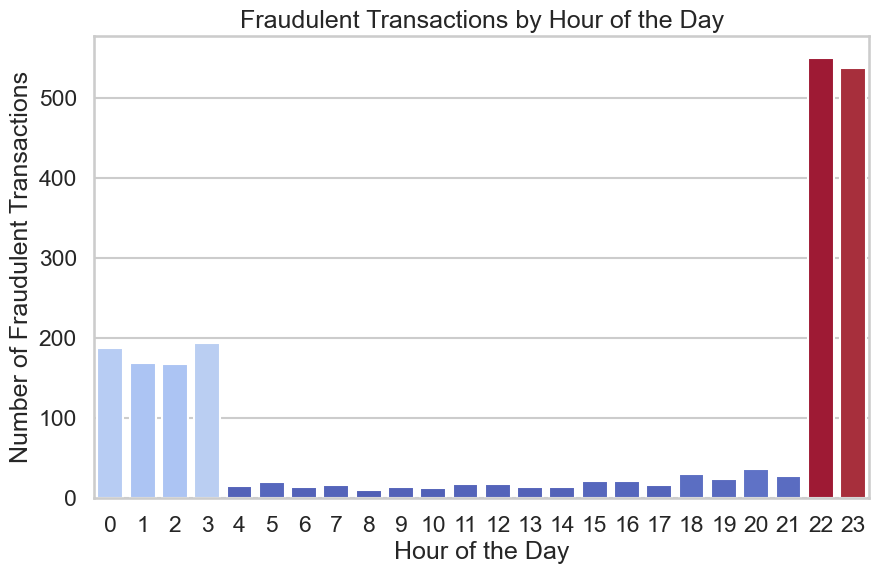

In [35]:
# Filter fraudulent transactions
fraud_transactions = enriched_df_pandas[enriched_df_pandas["is_fraud"] == True]

# Count the number of fraudulent transactions by hour of the day
fraud_counts = fraud_transactions["hour_of_day"].value_counts().sort_index()

# Create a color palette based on the counts
palette = sns.color_palette("coolwarm", as_cmap=True)

# Convert the palette to a list
palette_list = palette(fraud_counts.values / max(fraud_counts.values)).tolist()

sns.set_theme(style="whitegrid", context="talk")

# Plot the data
plt.figure(figsize=(10, 6))
sns.barplot(
    x=fraud_counts.index,
    y=fraud_counts.values,
    hue=fraud_counts.index,
    palette=palette_list,
    dodge=False,
    legend=False,
)
plt.title("Fraudulent Transactions by Hour of the Day")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Fraudulent Transactions")
plt.show()

## Fraudulent Transactions by Day of the Week

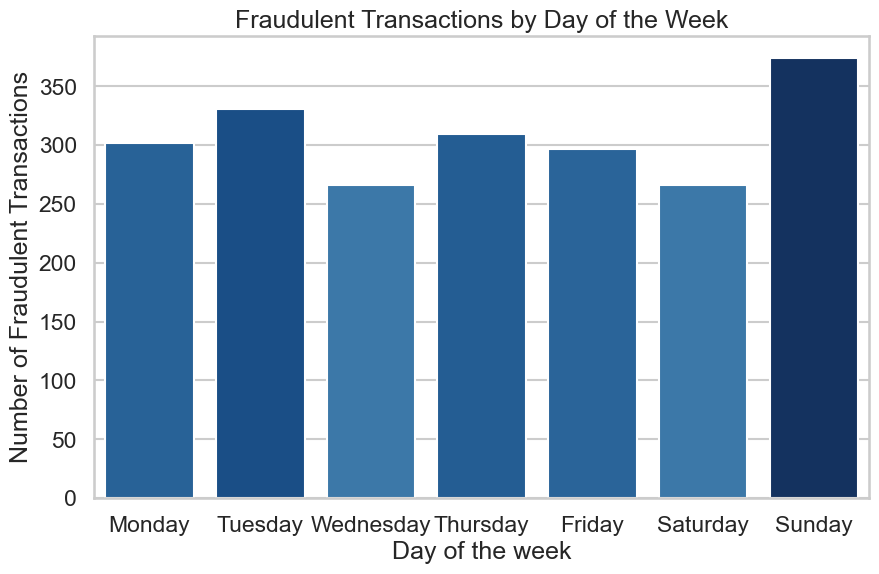

In [36]:
# Count the number of fraudulent transactions by hour of the day
fraud_counts_day = fraud_transactions["day_of_week"].value_counts().sort_index()

# Create a color palette based on the counts
palette = sns.color_palette("Blues", as_cmap=True)

# Convert the palette to a list
palette_list = palette(fraud_counts_day.values / max(fraud_counts_day.values)).tolist()

sns.set_theme(style="whitegrid", context="talk")

# Plot the data
plt.figure(figsize=(10, 6))
sns.barplot(
    x=fraud_counts_day.index,
    y=fraud_counts_day.values,
    hue=fraud_counts_day.index,
    palette=palette_list,
    dodge=False,
    legend=False,
)
plt.title("Fraudulent Transactions by Day of the Week")
plt.xlabel("Day of the week")
plt.ylabel("Number of Fraudulent Transactions")
plt.xticks(
    ticks=fraud_counts_day.index - 1,
    labels=[
        "Monday",
        "Tuesday",
        "Wednesday",
        "Thursday",
        "Friday",
        "Saturday",
        "Sunday",
    ],
)
plt.show()

The distribution of fraudulent transactions across the week is roughly even, with a slight increase observed on Sundays.

## Correlation Between Transaction Frequency and Fraud Incidence Over Time

In [37]:
# Convert the 'trans_date_trans_time' column to datetime
enriched_df_pandas["trans_date_trans_time"] = pd.to_datetime(
    enriched_df_pandas["trans_date_trans_time"]
)

# Set the 'trans_date_trans_time' as the index
enriched_df_pandas.set_index("trans_date_trans_time", inplace=True)

# Group by 'cc_num' and resample for different periods
transactions_per_day = enriched_df_pandas.groupby("cc_num").resample("D").size()
transactions_per_week = enriched_df_pandas.groupby("cc_num").resample("W").size()
transactions_per_two_weeks = enriched_df_pandas.groupby("cc_num").resample("2W").size()
transactions_per_month = enriched_df_pandas.groupby("cc_num").resample("ME").size()

# Reset index to make 'cc_num' a column again
transactions_per_day = transactions_per_day.reset_index(name="transactions_per_day")
transactions_per_week = transactions_per_week.reset_index(name="transactions_per_week")
transactions_per_two_weeks = transactions_per_two_weeks.reset_index(
    name="transactions_per_two_weeks"
)
transactions_per_month = transactions_per_month.reset_index(
    name="transactions_per_month"
)

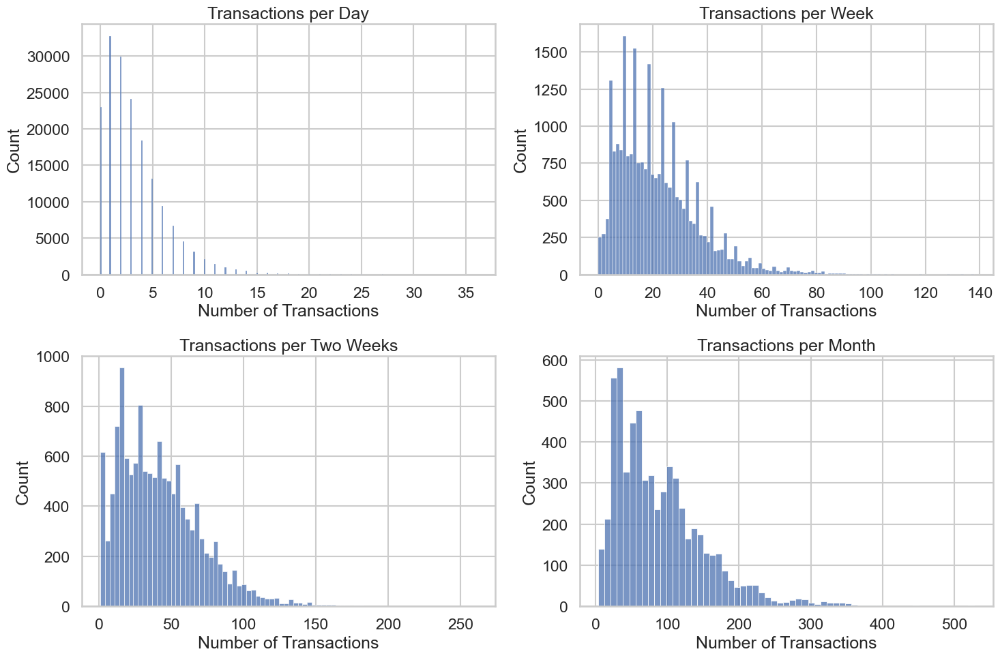

In [38]:
# Create a figure with subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

# Plot distributions
sns.histplot(data=transactions_per_day, x="transactions_per_day", ax=ax1)
ax1.set_title("Transactions per Day")
ax1.set_xlabel("Number of Transactions")

sns.histplot(data=transactions_per_week, x="transactions_per_week", ax=ax2)
ax2.set_title("Transactions per Week")
ax2.set_xlabel("Number of Transactions")

sns.histplot(data=transactions_per_two_weeks, x="transactions_per_two_weeks", ax=ax3)
ax3.set_title("Transactions per Two Weeks")
ax3.set_xlabel("Number of Transactions")

sns.histplot(data=transactions_per_month, x="transactions_per_month", ax=ax4)
ax4.set_title("Transactions per Month")
ax4.set_xlabel("Number of Transactions")

plt.tight_layout()
plt.show()

In [39]:
# Merge enriched_df_pandas with transactions_per_day using a time-based join
merged_day = pd.merge_asof(
    enriched_df_pandas.sort_values("trans_date_trans_time"),
    transactions_per_day.sort_values("trans_date_trans_time"),
    on="trans_date_trans_time",
    by="cc_num",
    tolerance=pd.Timedelta("1D"),
    direction="nearest",
)
# Filter for fraudulent transactions
fraud_transactions_day = merged_day[merged_day["is_fraud"] == True]

# Merge enriched_df_pandas with transactions_per_week using a time-based join
merged_week = pd.merge_asof(
    enriched_df_pandas.sort_values("trans_date_trans_time"),
    transactions_per_week.sort_values("trans_date_trans_time"),
    on="trans_date_trans_time",
    by="cc_num",
    tolerance=pd.Timedelta("7D"),
    direction="nearest",
)
# Filter for fraudulent transactions
fraud_transactions_week = merged_week[merged_week["is_fraud"] == True]

# Merge enriched_df_pandas with transactions_per_two_weeks using a time-based join
merged_two_weeks = pd.merge_asof(
    enriched_df_pandas.sort_values("trans_date_trans_time"),
    transactions_per_two_weeks.sort_values("trans_date_trans_time"),
    on="trans_date_trans_time",
    by="cc_num",
    tolerance=pd.Timedelta("14D"),
    direction="nearest",
)
# Filter for fraudulent transactions
fraud_transactions_two_weeks = merged_two_weeks[merged_two_weeks["is_fraud"] == True]

# Merge enriched_df_pandas with transactions_per_month using a time-based join
merged_month = pd.merge_asof(
    enriched_df_pandas.sort_values("trans_date_trans_time"),
    transactions_per_month.sort_values("trans_date_trans_time"),
    on="trans_date_trans_time",
    by="cc_num",
    tolerance=pd.Timedelta("30D"),
    direction="nearest",
)
# Filter for fraudulent transactions
fraud_transactions_month = merged_month[merged_month["is_fraud"] == True]

# Merge the necessary DataFrames to include the required columns using a time-based join
merged_all = pd.merge_asof(
    merged_day.sort_values("trans_date_trans_time"),
    transactions_per_week.sort_values("trans_date_trans_time"),
    on="trans_date_trans_time",
    by="cc_num",
    tolerance=pd.Timedelta("7D"),
    direction="nearest",
)
merged_all = pd.merge_asof(
    merged_all.sort_values("trans_date_trans_time"),
    transactions_per_two_weeks.sort_values("trans_date_trans_time"),
    on="trans_date_trans_time",
    by="cc_num",
    tolerance=pd.Timedelta("14D"),
    direction="nearest",
)
merged_all = pd.merge_asof(
    merged_all.sort_values("trans_date_trans_time"),
    transactions_per_month.sort_values("trans_date_trans_time"),
    on="trans_date_trans_time",
    by="cc_num",
    tolerance=pd.Timedelta("30D"),
    direction="nearest",
)

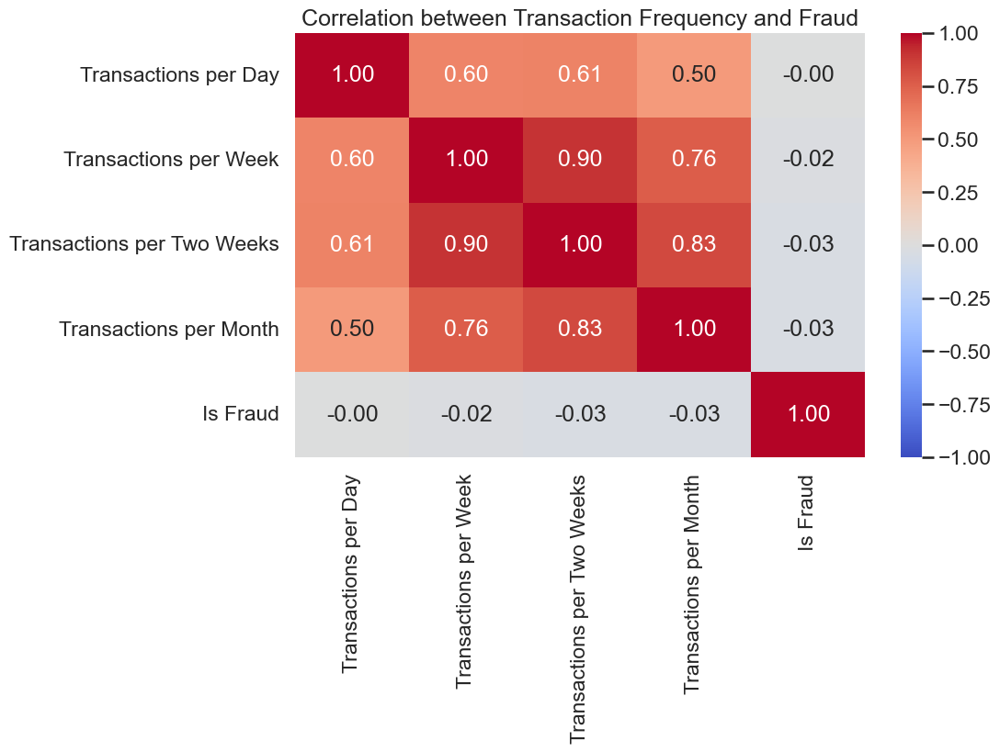

In [40]:
# Calculate the correlation matrix for the relevant columns
correlation_matrix = merged_all[
    [
        "transactions_per_day",
        "transactions_per_week",
        "transactions_per_two_weeks",
        "transactions_per_month",
        "is_fraud",
    ]
].corr()

# Rename the columns and index for better readability
correlation_matrix.columns = [
    "Transactions per Day",
    "Transactions per Week",
    "Transactions per Two Weeks",
    "Transactions per Month",
    "Is Fraud",
]
correlation_matrix.index = [
    "Transactions per Day",
    "Transactions per Week",
    "Transactions per Two Weeks",
    "Transactions per Month",
    "Is Fraud",
]

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1, fmt=".2f")
plt.title("Correlation between Transaction Frequency and Fraud")
plt.show()

No correlation found

## Seasonal Patterns in Daily Fraudulent Transaction Frequency

Note: The monthly patterns are omitted as the time series only covers six months of a single year, limiting the ability to derive meaningful insights.

In [41]:
enriched_df_pandas["trans_date_trans_time"] = enriched_df_pandas.index
enriched_df_pandas.reset_index(drop=True, inplace=True)
enriched_df_pandas["date"] = enriched_df_pandas["trans_date_trans_time"].dt.date
enriched_df_pandas.head()

,hour_of_day,day_of_week,tx_is_weekend,tx_category,distance_from_merch,city_pop_cat,gender,age,job_group,amt,amt_deviation,is_frequently_visited_merchant,cc_num,is_fraud,trans_date_trans_time,date
0,12,7,True,personal_care,24613.746071,city,False,52,Engineering,2.86,3.695,False,2.291160e+15,False,2020-06-21 12:14:00,2020-06-21
1,12,7,True,personal_care,104834.043428,hamlet,True,30,Creative,29.84,9.140,False,3.573030e+15,False,2020-06-21 12:14:00,2020-06-21
2,12,7,True,health_fitness,59204.795631,city,True,50,Education,41.28,17.340,False,3.598220e+15,False,2020-06-21 12:14:00,2020-06-21
3,12,7,True,misc_pos,27615.117073,city,False,33,Creative,60.05,0.000,False,3.591920e+15,False,2020-06-21 12:15:00,2020-06-21
4,12,7,True,travel,104423.174625,village,False,65,Creative,3.19,0.000,False,3.526830e+15,False,2020-06-21 12:15:00,2020-06-21


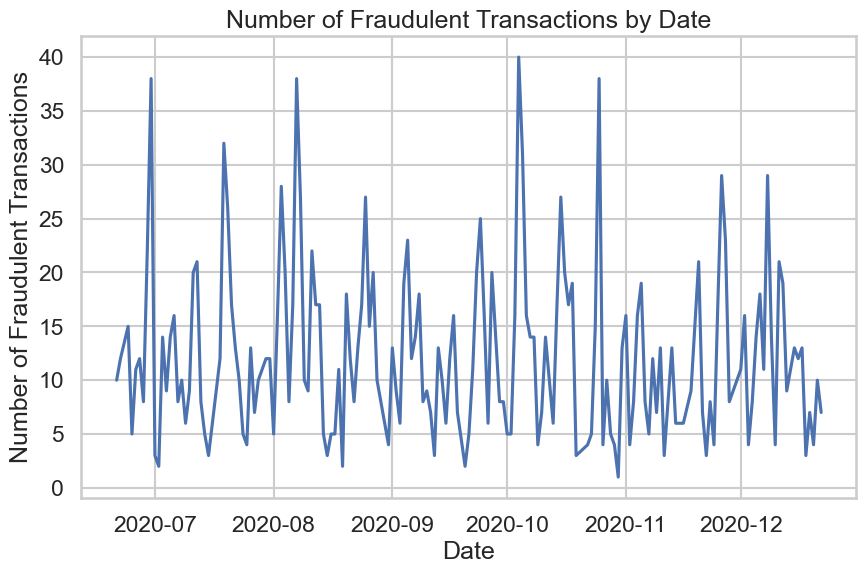

In [42]:
# Plot the number of fraudlent transactions against date using a line plot
plt.figure(figsize=(10, 6))
enriched_df_pandas[enriched_df_pandas["is_fraud"] == True].groupby("date").size().plot()
plt.title("Number of Fraudulent Transactions by Date")
plt.xlabel("Date")
plt.ylabel("Number of Fraudulent Transactions")
plt.show()

In [43]:
# The data is from 2020-06-21 to 2020-12-31
print(enriched_df_pandas["date"].sort_values(ascending=False).head())
print(enriched_df_pandas["date"].sort_values(ascending=False).tail())

555718    2020-12-31
553450    2020-12-31
553474    2020-12-31
553473    2020-12-31
553472    2020-12-31
Name: date, dtype: object
1357    2020-06-21
1358    2020-06-21
1359    2020-06-21
1360    2020-06-21
0       2020-06-21
Name: date, dtype: object


In [44]:
fraud_count_over_time = (
    enriched_df_pandas[enriched_df_pandas["is_fraud"] == True].groupby("date").size()
)
fraud_count_over_time = pd.DataFrame(fraud_count_over_time, columns=["fraud_count"])
fraud_count_over_time.head()

,fraud_count
date,
2020-06-21,10
2020-06-22,12
2020-06-24,15
2020-06-25,5
2020-06-26,11


### Assessing Time Series Stationarity: Augmented Dickey-Fuller and Partial Autocorrelation Analysis

In [45]:
fraud_count_over_time["detrended"] = detrend(fraud_count_over_time["fraud_count"])
warnings.filterwarnings("ignore", category=InterpolationWarning)
adf_test = adfuller(fraud_count_over_time["detrended"].dropna())
print("ADF Statistic:", adf_test[0])
print("p-value:", adf_test[1])
kpss_test = kpss(fraud_count_over_time["detrended"].dropna())
print("KPSS Statistic:", kpss_test[0])
print("p-value:", kpss_test[1])

ADF Statistic: -9.852178766450757
p-value: 4.455556650455574e-17
KPSS Statistic: 0.027808208363505383
p-value: 0.1


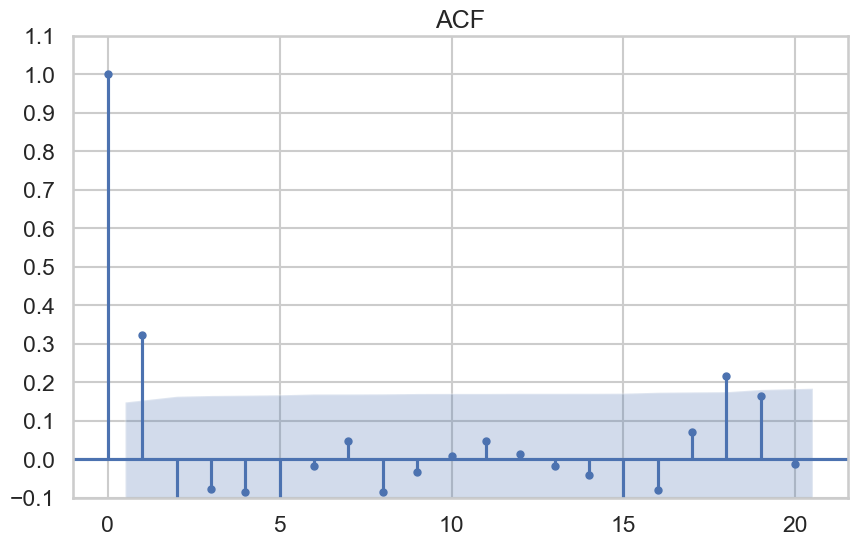

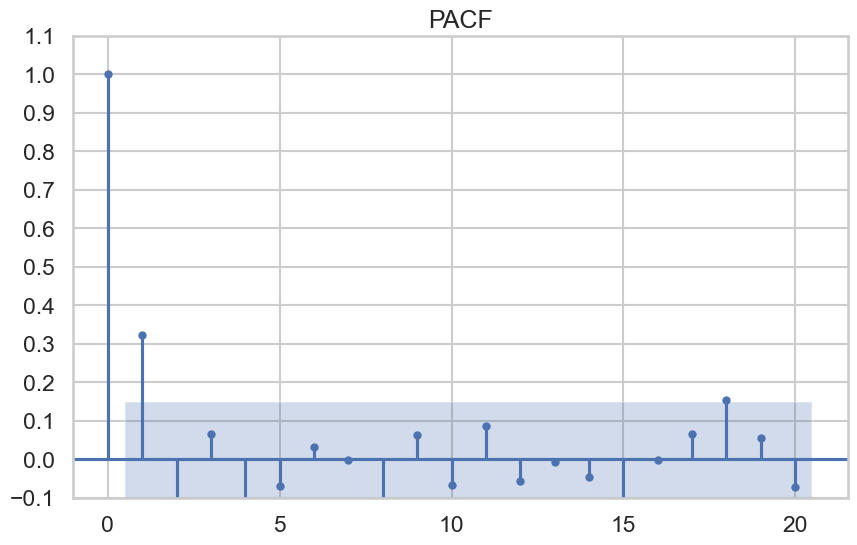

In [46]:
# create acf
fig, ax = plt.subplots(1, figsize=(10, 6), dpi=100)
plot_acf(fraud_count_over_time["fraud_count"], lags=20, ax=ax)
plt.ylim([-0.05, 0.25])
plt.yticks(np.arange(-0.10, 1.1, 0.1))
plt.title("ACF")
plt.show()
# create pacf
fig, ax = plt.subplots(1, figsize=(10, 6), dpi=100)
plot_pacf(fraud_count_over_time["fraud_count"], lags=20, ax=ax)
plt.title("PACF")
plt.ylim([-0.05, 0.25])
plt.yticks(np.arange(-0.10, 1.1, 0.1))
plt.show()

The ACF decays quickly after lag 1, and the PACF has a single significant spike at lag 1.

This suggests that if we wanted to fit an ARIMA model, we could try adding AR(1) part. Also, experiment with the MA part.

### Time Series Decomposition

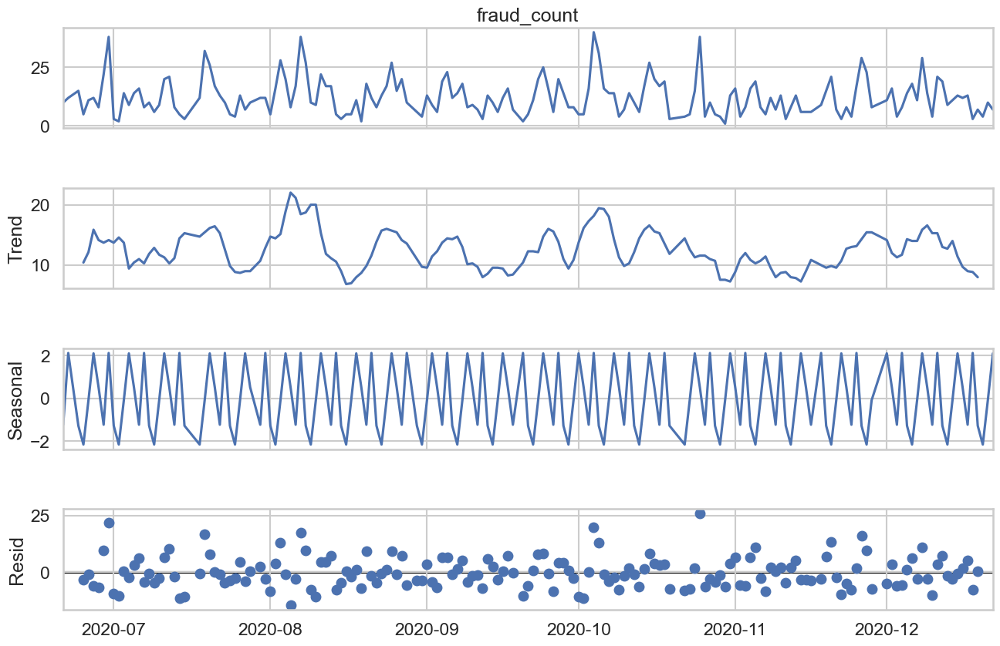

In [47]:
# Ensure date is datetime and set as index
fraud_count_over_time.index = pd.to_datetime(fraud_count_over_time.index)

# Decompose (use 'additive' or 'multiplicative' based on data behavior)
decomposition = seasonal_decompose(
    fraud_count_over_time["fraud_count"], model="additive", period=7
)  # Weekly pattern

# Plot the decomposition with a larger figure size

fig = decomposition.plot()
fig.set_size_inches(15, 10)

- Trend (Second Plot): Captures the underlying direction of the data after smoothing. There are periods where the fraud count increases and periods where it decreases, but it is hard to describe it without additional analysis.
- Seasonal (Third Plot): The seasonal component captures repeating short-term patterns. A clear pattern is visible, with consistent ups and downs that repeat approximately every 7 days (weekly pattern). Fraudulent transactions have a weekly seasonality, indicating a recurring pattern across specific days of the week.
-  Residual (Fourth Plot): The residual component represents the noise or irregularities in the data after removing the trend and seasonality. The points are scattered around zero without any clear pattern, suggesting that most of the systematic structure (trend and seasonality) has been successfully captured. A few outliers are visible, representing unexpected spikes in fraudulent transactions.

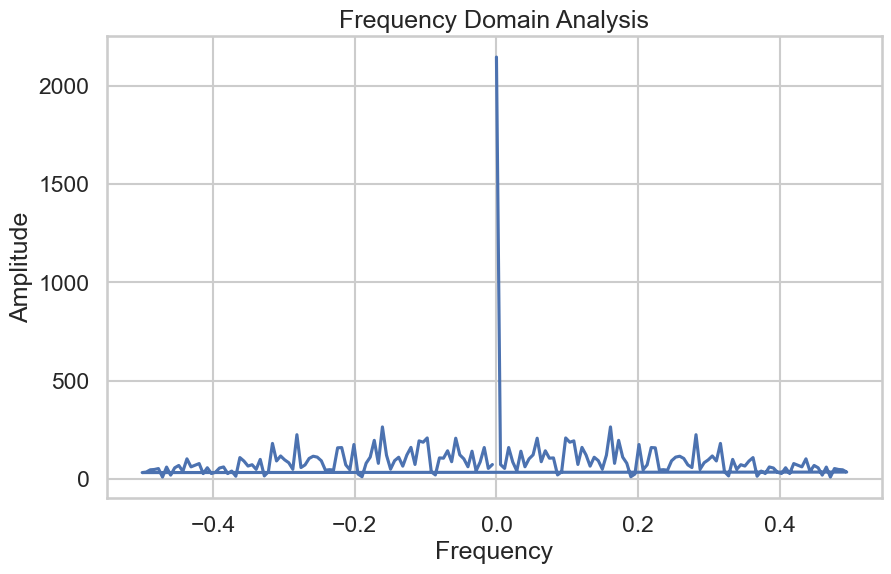

In [48]:
fft = np.fft.fft(fraud_count_over_time["fraud_count"].fillna(0))
freq = np.fft.fftfreq(len(fft))

fig, ax = plt.subplots(figsize=(10, 6))
plt.plot(freq, abs(fft))
plt.title("Frequency Domain Analysis")
plt.xlabel("Frequency")
plt.ylabel("Amplitude")
plt.show()

- The tall spike at frequency 0 means the data has a strong trend—it’s moving up or down over time rather than just repeating patterns.
- There aren’t any big spikes at other frequencies, which means there’s no clear repeating cycle or seasonality standing out.
- The rest of the plot looks like random noise, showing no obvious pattern in the other frequencies. 

The data has a strong overall trend but no strong repeating seasonal pattern. The rest looks mostly random.

The overall trend dominates the data (long-term changes in fraud count). Weekly patterns exist but are weak and periodic, adding small cycles on top of the larger trend. The random noise contributes significantly to the data, which might obscure clearer seasonal patterns.

### Detrending Time Series Data for Stationarity Analysis

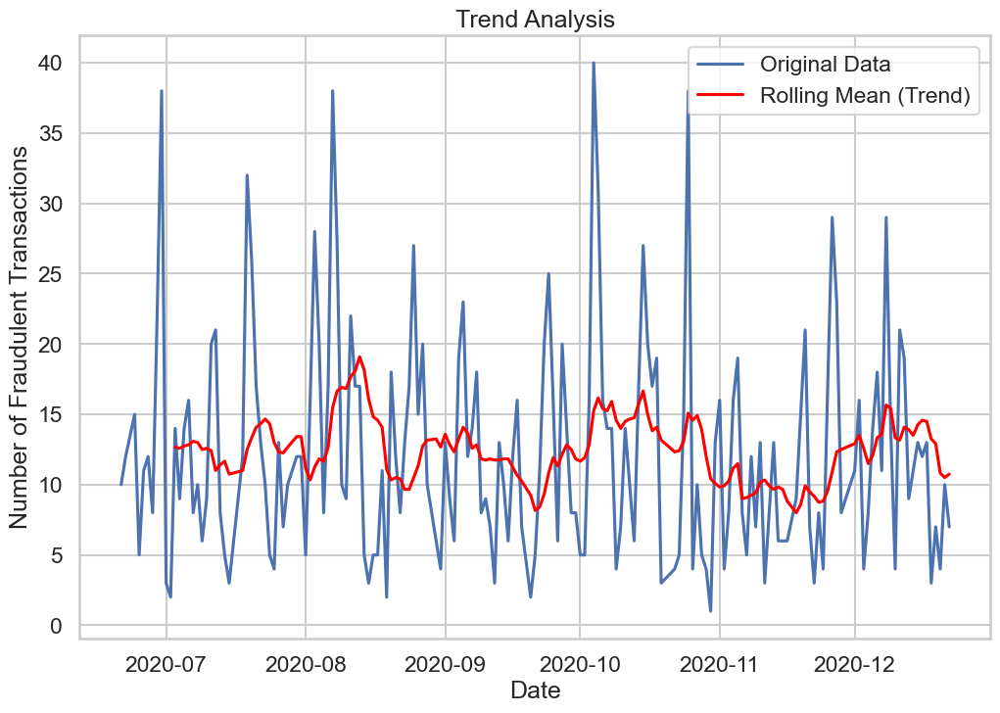

In [49]:
fraud_count_over_time["rolling_mean"] = (
    fraud_count_over_time["fraud_count"].rolling(window=12).mean()
)

# Visualize the Trend
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(fraud_count_over_time["fraud_count"], label="Original Data")
plt.plot(
    fraud_count_over_time["rolling_mean"], label="Rolling Mean (Trend)", color="red"
)
plt.title("Trend Analysis")
plt.xlabel("Date")
plt.ylabel("Number of Fraudulent Transactions")
plt.legend()
plt.show()

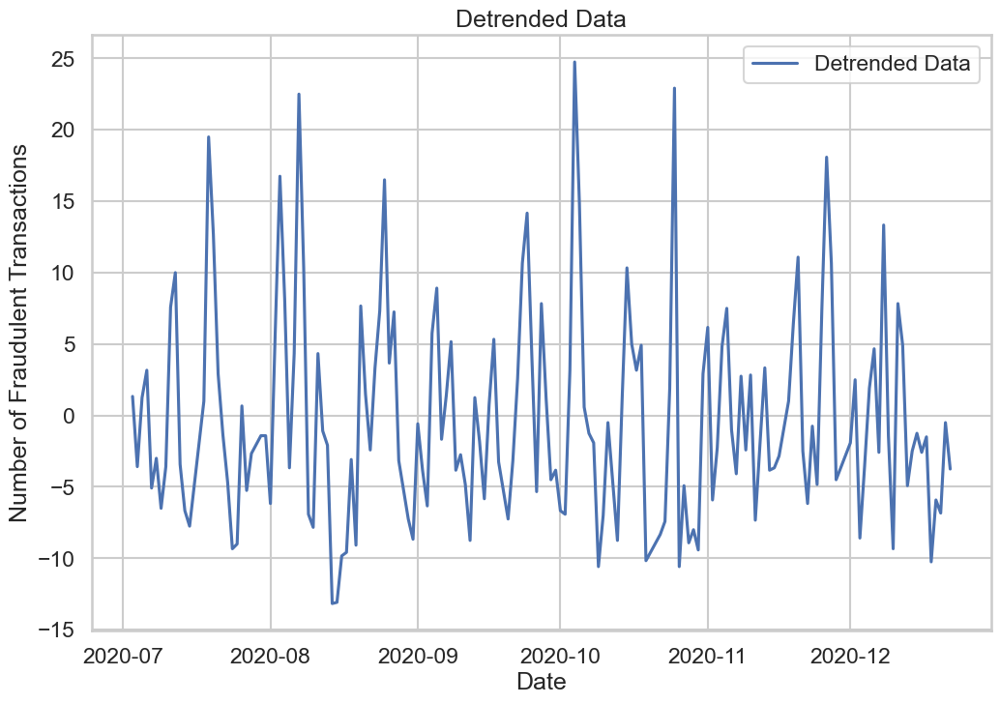

In [50]:
# Subtracting the Rolling Mean
fraud_count_over_time["detrended"] = (
    fraud_count_over_time["fraud_count"] - fraud_count_over_time["rolling_mean"]
)

fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(fraud_count_over_time["detrended"], label="Detrended Data")
plt.legend()
plt.title("Detrended Data")
plt.xlabel("Date")
plt.ylabel("Number of Fraudulent Transactions")
plt.show()

In [51]:
adf_test = adfuller(fraud_count_over_time["detrended"].dropna())
print("ADF Statistic:", adf_test[0])
print("p-value:", adf_test[1])
kpss_test = kpss(fraud_count_over_time["detrended"].dropna())
print("KPSS Statistic:", kpss_test[0])
print("p-value:", kpss_test[1])

ADF Statistic: -6.133324763227146
p-value: 8.300448177524904e-08
KPSS Statistic: 0.028953753085651967
p-value: 0.1


The process is stationary, as it was before.

The results of the time series decomposition remain the same.

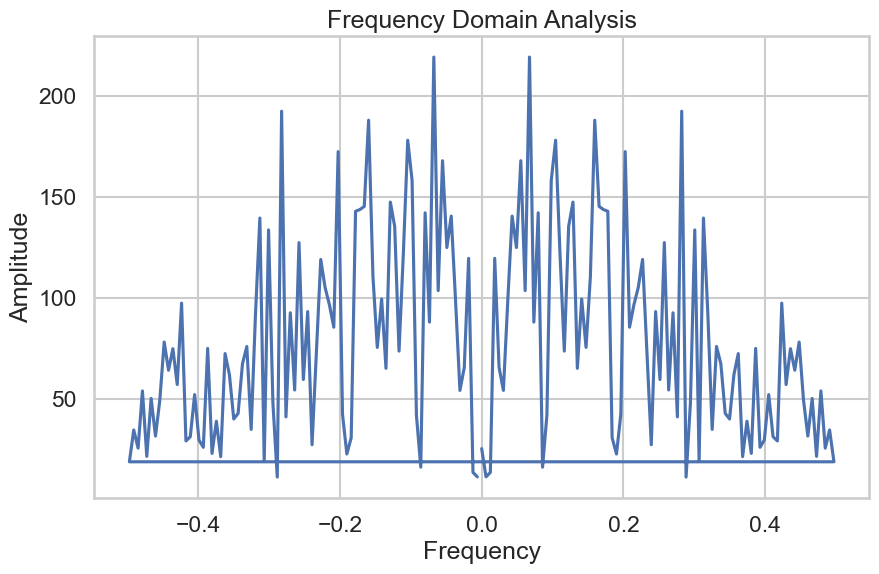

In [52]:
fft = np.fft.fft(fraud_count_over_time["detrended"].dropna())
freq = np.fft.fftfreq(len(fft))

fig, ax = plt.subplots(figsize=(10, 6))
plt.plot(freq, abs(fft))
plt.title("Frequency Domain Analysis")
plt.xlabel("Frequency")
plt.ylabel("Amplitude")
plt.show()

- The peak is gone, and the frequencies are now spread out, suggesting that the long-term trend was successfully removed, and what's left is likely a combination of seasonal patterns, noise, or higher-frequency components.
- If there were strong seasonal components (e.g., weekly or monthly cycles), we'd expect visible peaks at specific non-zero frequencies. In this plot, no clear periodic frequency stands out, which suggests seasonality might not be very strong or seasonality is complex and not well captured in the frequency domain. 

### Residual Analysis

In [53]:
# Test Ljunga-Boxa
ljung_box_result = acorr_ljungbox(
    decomposition.resid.dropna(), lags=[10], return_df=True
)
print("Ljung-Box Test Result:", ljung_box_result)

Ljung-Box Test Result:       lb_stat     lb_pvalue
10  65.351501  3.471721e-10


We reject the null hypothesis, that residuals are white nosie -> there exists some autocorrelation in the residuals.

In [54]:
adf_test = adfuller(decomposition.resid.dropna())
print("ADF Statistic:", adf_test[0])
print("p-value:", adf_test[1])
kpss_test = kpss(decomposition.resid.dropna())
print("KPSS Statistic:", kpss_test[0])
print("p-value:", kpss_test[1])

ADF Statistic: -8.79568769549449
p-value: 2.1796772137003395e-14
KPSS Statistic: 0.10955193393933503
p-value: 0.1


ADF Test: Rejects non-stationarity → Stationary

KPSS Test: Fails to reject stationarity → Stationary

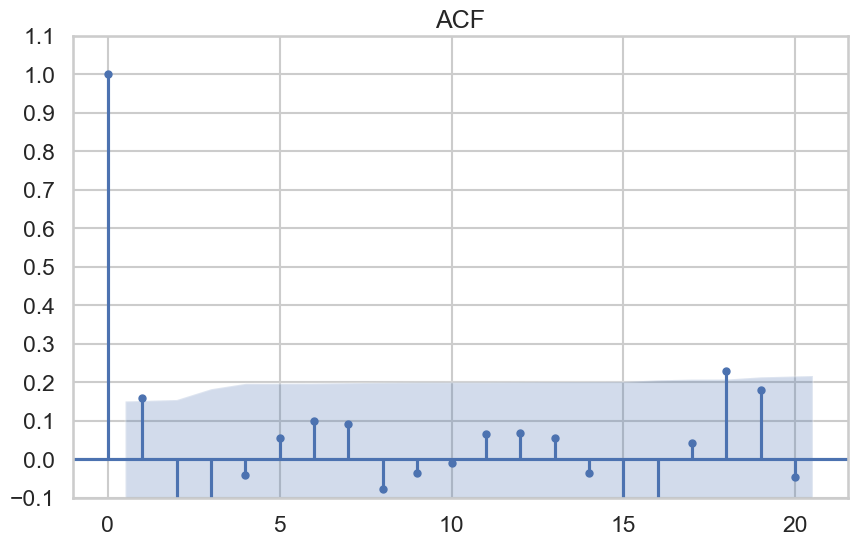

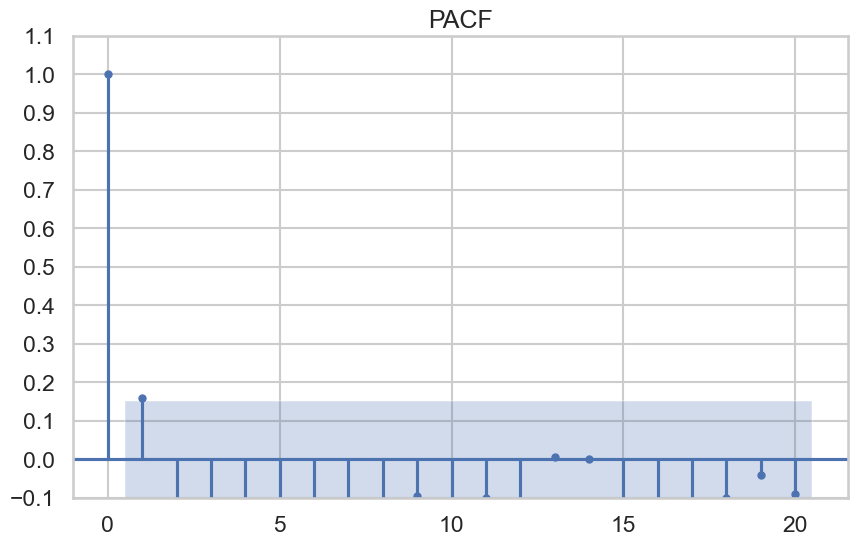

In [55]:
# create acf
fig, ax = plt.subplots(1, figsize=(10, 6), dpi=100)
plot_acf(decomposition.resid.dropna(), lags=20, ax=ax)
plt.ylim([-0.05, 0.25])
plt.yticks(np.arange(-0.10, 1.1, 0.1))
plt.title("ACF")
plt.show()
# create pacf
fig, ax = plt.subplots(1, figsize=(10, 6), dpi=100)
plot_pacf(decomposition.resid.dropna(), lags=20, ax=ax)
plt.title("PACF")
plt.ylim([-0.05, 0.25])
plt.yticks(np.arange(-0.10, 1.1, 0.1))
plt.show()

We can suspect that there is an AR(1) process.

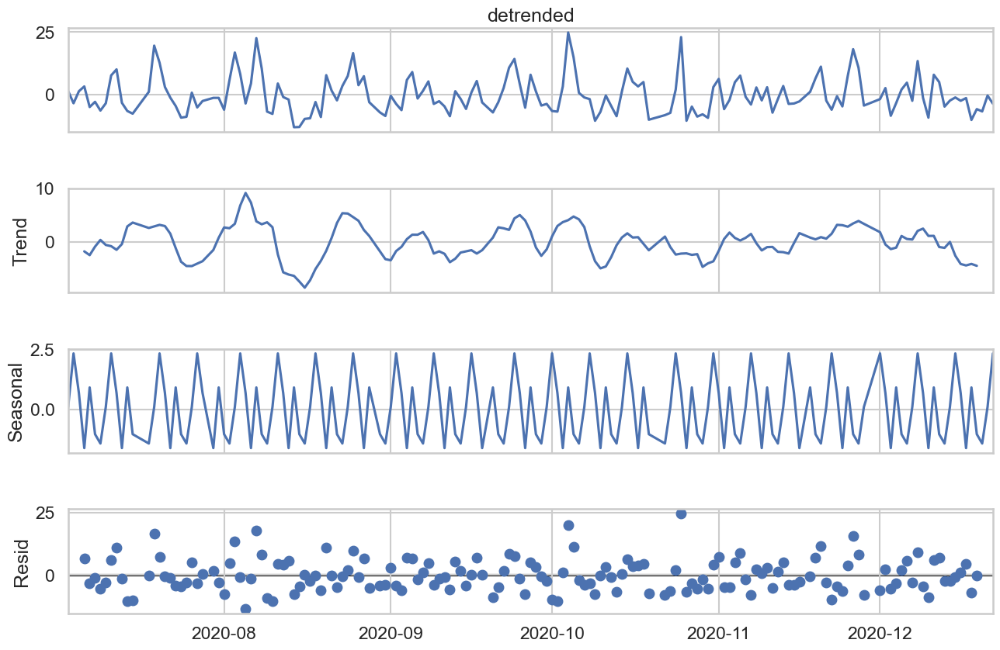

In [56]:
# Decompose (use 'additive' or 'multiplicative' based on data behavior)
decomposition = seasonal_decompose(
    fraud_count_over_time["detrended"].dropna(), model="additive", period=7
)  # Weekly pattern

# Plot the decomposition with a larger figure size

fig = decomposition.plot()
fig.set_size_inches(15, 10)

In the seasonal component, a strong, repeating seasonal pattern is still observed.

### Fraudulent Transaction Forecasting with ARIMA

To understand the timeseries better, an ARIMA or SARIMA model could be fitted and assessed. We fit a model, that could give more insights into weather the weekly pattern is significant.

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.32243D+00    |proj g|=  1.03682D-01

At iterate    5    f=  3.31559D+00    |proj g|=  1.17500D-02

At iterate   10    f=  3.31534D+00    |proj g|=  1.53621D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     12     14      1     0     0   1.227D-06   3.315D+00
  F =   3.3153359691955040     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Ljung-Box Test Result:     lb_stat  lb_pvalue
10  11.0178   0.356133
 

 This problem is unconstrained.


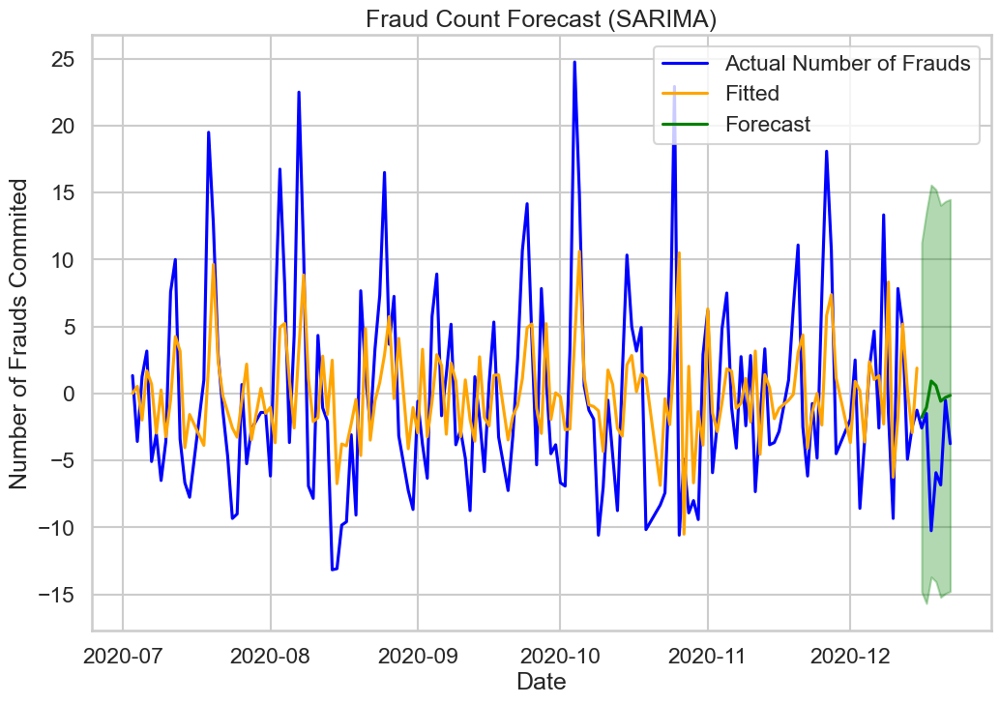

In [57]:
# Split the data into train and test sets for the model - 7 days test data
train_data = fraud_count_over_time["detrended"].dropna()[:-7]
test_data = fraud_count_over_time["detrended"].dropna()[-7:]

# Ensure train_data and test_data have a proper datetime index
train_data.index = pd.to_datetime(train_data.index)
test_data.index = pd.to_datetime(test_data.index)

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module="statsmodels")
warnings.filterwarnings("ignore", category=FutureWarning, module="statsmodels")

sarima_model = SARIMAX(train_data, order=(1, 0, 1), seasonal_order=(1, 0, 0, 7))
sarima_fit = sarima_model.fit()

# Forecast for the next 7 days
sarima_forecast = sarima_fit.get_forecast(steps=7)
sarima_forecast_index = pd.date_range(start=test_data.index[0], periods=7, freq="D")
sarima_forecast_series = sarima_forecast.predicted_mean
sarima_forecast_series.index = sarima_forecast_index
sarima_conf_int = sarima_forecast.conf_int()
sarima_conf_int.columns = ["lower", "upper"]
sarima_conf_int.index = sarima_forecast_index

# Test Ljung-Box
ljung_box_result = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
print("Ljung-Box Test Result:", ljung_box_result)

# Model summary
sarima_summary = sarima_fit.summary()
print(sarima_summary)

sarima_in_sample = sarima_fit.predict(
    start=train_data.index[0], end=train_data.index[-1]
)

# Ensure the indices are datetime
sarima_in_sample.index = pd.to_datetime(sarima_in_sample.index)
sarima_forecast_series.index = pd.to_datetime(sarima_forecast_series.index)

plt.figure(figsize=(12, 8))
# Ensure the index is in datetime format
fraud_count_over_time.index = pd.to_datetime(fraud_count_over_time.index)

plt.plot(
    fraud_count_over_time["detrended"].dropna(),
    label="Actual Number of Frauds",
    color="blue",
)
plt.plot(sarima_in_sample, label="Fitted", color="orange")
plt.plot(sarima_forecast_series, label="Forecast", color="green")
plt.fill_between(
    sarima_conf_int.index,
    sarima_conf_int["lower"],
    sarima_conf_int["upper"],
    color="green",
    alpha=0.3,
)
plt.title("Fraud Count Forecast (SARIMA)")
plt.xlabel("Date")
plt.ylabel("Number of Frauds Commited")
plt.legend()
plt.show()

####  Model Coefficients

- MA(1) is significant, indicating short-term memory in the time series.
- AR(1) and Seasonal AR(7) are not significant, suggesting these terms might not be contributing much to the model.
- sigma² (variance of residuals) is highly significant, indicating noise in the residuals.

#### Diagnostics Tests

- Ljung-Box Test: The high p-value indicates that the residuals are uncorrelated, suggesting the model has successfully captured the autocorrelations in the data.
- Jarque-Bera Test: Residuals are not normally distributed. This may impact confidence intervals and hypothesis testing.
- Heteroskedasticity (H Test): No evidence of heteroskedasticity; residuals have constant variance over time.

#### Final Thoughts

- Seasonal effects are less clear, and the AR terms seem unnecessary.
- Residuals are uncorrelated and homoscedastic, but not normally distributed.
- We can try to simplify the model by removing non-significant terms, but probably because we only have 6 months of data, we cannot discover some significant patterns. 
- Therefore we'll drop the topic with the conclusion, that <b>weekly seasonality is not significant and there may be other factors we cannot discover from the present dataset</b>.

## Findings

### Fraudulent Transactions by Hour of the Day

Fraudulent transactions frequently occur during late-night hours, especially between 10:00 PM and 4:00 AM. This pattern might be attributed to reduced monitoring and increased vulnerability during nighttime.

### Fraudulent Transactions by Day of the Week

Fraud is evenly distributed across the week, with a slight peak on Sundays.

### Correlation Between Transaction Frequency and Fraud Incidence Over Time

No significant correlation found.

### Seasonal Patterns in Daily Fraudulent Transaction Frequency

We analyze the time series by checking for stationarity, decomposing the series, and examining the frequency domain analysis plot. Below are the key conclusions:

1. Stationarity: The process is stationary, as confirmed by statistical tests.
2. Trend Removal: The overall trend dominates the data and is successfully removed. The series remains stationary after detrending.
3. Frequency Domain Analysis: No clear periodic frequency stands out, suggesting that seasonality might either be weak or complex and not well captured in the frequency domain.
4. Series Decomposition: Despite the unclear frequency domain results, a weekly pattern is still visible in the series decomposition.
5. SARIMA model is fitted to give a final conclusion:

- Weekly seasonality is not significant for modeling the time series of fraud counts.
- There may be other factors influencing the data that cannot be identified from the present dataset.
- These findings suggest that while some seasonal patterns exist, they are not strong enough to meaningfully improve the model's performance. 
- The analysis ultimately confirmed the initial visual insight (Fraudulent Transactions by Day of the Week), but the process added confidence and statistical validation to the conclusion.

# Clustering

We investigate whether cluster analysis can be used to identify distinct groups of transactions based on their characteristics and whether we can separate fraudulent transactions from legitimate ones by clustering.

We set off by visualizing our prepared features in a two-dimensional space using UMAP (Uniform Manifold Approximation and Projection). UMAP is a dimensionality reduction technique that preserves both local and global structure, making it ideal for visualizing high-dimensional data in a lower-dimensional space. By projecting the data onto two dimensions, we can observe the relationships between transactions and identify potential clusters.

In [58]:
n = 10_000
feature_projections_df = (
    attach_projections(
        normalized_features_df.limit(n).select(
            vector=pl.concat_list("*"),
            is_fraud=df.limit(n).get_column("is_fraud").cast(pl.Boolean),
            **{
                col: features_df.limit(n).get_column(col) for col in features_df.columns
            },
        )
    )
    .sort("is_fraud")
    .select(
        "vector",
        "projection",
        pl.exclude("vector", "projection", "is_fraud"),
        "is_fraud",
    )
)
feature_projections_df.head()

vector,projection,tx_hour,tx_day_of_week,tx_is_weekend,tx_category,distance_from_merch,city_pop_cat,gender,age,job_group,amt,amt_deviation,is_frequently_visited_merchant,is_fraud
list[f64],list[f32],i8,i8,bool,str,f64,str,bool,u16,str,f64,f64,bool,bool
"[12.0, 7.0, … 0.0]","[-4.147266, -10.594178]",12,7,true,"""personal_care""",24613.746071,"""city""",false,52,"""Engineering""",2.86,3.695,false,false
"[12.0, 7.0, … 0.0]","[16.207123, 2.096534]",12,7,true,"""personal_care""",104834.043428,"""hamlet""",true,30,"""Creative""",29.84,9.14,false,false
"[12.0, 7.0, … 0.0]","[3.748188, 6.139663]",12,7,true,"""health_fitness""",59204.795631,"""city""",true,50,"""Education""",41.28,17.34,false,false
"[12.0, 7.0, … 0.0]","[-7.032322, -8.113666]",12,7,true,"""misc_pos""",27615.117073,"""city""",false,33,"""Creative""",60.05,0.0,false,false
"[12.0, 7.0, … 0.0]","[10.784208, -1.481717]",12,7,true,"""travel""",104423.174625,"""village""",false,65,"""Creative""",3.19,0.0,false,false


The visualization below demonstrates that transactions are organized into non-spherical clusters, suggesting they can be grouped effectively. However, it also becomes evident that in the existing feature space, distinguishing between fraudulent and legitimate transactions is challenging. The orange data points, representing fraudulent transactions, are dispersed throughout the plot, indicating the difficulty in separating them from legitimate ones.

In [59]:
feature_projections_df.sort("is_fraud").with_columns(
    x=pl.col("projection").list.get(0),
    y=pl.col("projection").list.get(1),
).plot.point(
    x="x:Q",
    y="y:Q",
    color="is_fraud:N",
    tooltip=feature_projections_df.select(pl.exclude("vector", "projection")).columns,
).properties(
    title="Fraud Detection Features",
)

alt.Chart(...)

We explored various modifications to the feature space and applied clustering algorithms such as KMeans, DBSCAN, and agglomerative hierarchical clustering. Despite these efforts, we were unable to determine that any of these methods effectively distinguish between fraudulent and legitimate transactions.

Therefore, we shifted our attention to supervised learning methods, which are better suited for classification tasks and can leverage the labeled data to identify patterns that separate fraudulent from legitimate transactions.

# Classifier Training & Selection

In what follows, we explore how to train and select classifiers to distinguish between fraudulent and legitimate transactions, a task made complex by the rare occurrence of fraud in credit card data.

To address class imbalance, we apply SMOTE for oversampling the minority class and NearMiss for undersampling the majority class, resulting in three datasets: original, SMOTE-oversampled, and NearMiss-undersampled. These techniques help our models better identify fraud without bias toward the more frequent legitimate transactions.

We train decision tree and random forest classifiers, which excel in this task. Decision trees are interpretable and capture nonlinear patterns, while random forests, as ensembles of trees, enhance accuracy and robustness by mitigating overfitting.

We evaluate each model using classification reports and confusion matrices, focusing on accuracy, precision, recall, and F1-score:

- **Accuracy** indicates overall correctness but is less reliable in imbalanced data.
- **Precision** shows the correctness of fraud predictions, minimizing false alarms.
- **Recall** ensures all fraud cases are detected, preventing missed fraud.
- **F1-score** balances precision and recall, key for catching fraud while minimizing errors.

We also analyze feature importance to understand which attributes contribute most to fraud detection.

In [60]:
X = normalized_features_df.to_numpy()
y = df.select(is_fraud).to_numpy().squeeze()

In [61]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
)

In [62]:
smote = SMOTE(random_state=42)
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train, y_train)

In [63]:
nearmiss = NearMiss()
X_train_undersampled, y_train_undersampled = nearmiss.fit_resample(X_train, y_train)

In [64]:
datasets = [
    {
        "name": "Original Samples",
        "data": [X_train, y_train],
    },
    {
        "name": "Samples Oversampled with SMOTE",
        "data": [X_train_oversampled, y_train_oversampled],
    },
    {
        "name": "Samples Undersampled with NearMiss",
        "data": [X_train_undersampled, y_train_undersampled],
    },
]

models = [
    {
        "name": "Decision Tree",
        "model": DecisionTreeClassifier(random_state=42),
    },
    {
        "name": "Random Forest",
        "model": RandomForestClassifier(random_state=42),
    },
]

::: {.content-hidden}

In [65]:
results = []

with tqdm(total=len(datasets), desc="Datasets") as pbar1:
    for dataset_cfg in datasets:
        dataset_name = dataset_cfg["name"]
        X_train, y_train = dataset_cfg["data"]
        with tqdm(total=len(models), desc="Models", leave=False) as pbar2:
            for model_cfg in models:
                tic = time.time()
                model_name = model_cfg["name"]
                model = model_cfg["model"]
                model.fit(X_train, y_train)
                toc = time.time()

                y_pred = model.predict(X_test)
                report = classification_report(y_test, y_pred, output_dict=True)
                cm = confusion_matrix(y_test, y_pred)
                feature_importances = (
                    pl.from_dict(
                        {
                            "feature": normalized_features_df.columns,
                            "importance": model.feature_importances_,
                        }
                    )
                    .sort("importance", descending=True)
                    .to_dicts()
                )
                training_time = toc - tic

                results.append(
                    {
                        "dataset": dataset_name,
                        "model": model_name,
                        "report": report,
                        "confusion_matrix": cm,
                        "feature_importances": feature_importances,
                        "training_time": training_time,
                    }
                )
                pbar2.update(1)
        pbar1.update(1)

Datasets:   0%|          | 0/3 [00:00<?, ?it/s]

Models:   0%|          | 0/2 [00:00<?, ?it/s]

Models:   0%|          | 0/2 [00:00<?, ?it/s]

Models:   0%|          | 0/2 [00:00<?, ?it/s]

:::

In [66]:
def visualize_model_evaluation(result: dict[str, Any]) -> None:
    # Create subplot figure
    fig = make_subplots(
        rows=4,
        cols=1,
        subplot_titles=(
            "Class-wise Performance Metrics",
            "Confusion Matrix",
            "Top 10 Feature Importances",
            "Overall Metrics",
        ),
        specs=[
            [{"type": "bar"}],
            [{"type": "heatmap"}],
            [{"type": "bar"}],
            [{"type": "bar"}],
        ],
        vertical_spacing=0.1,
    )

    # 1. Class-wise metrics plot
    classes = [
        key
        for key in result["report"].keys()
        if key not in ["accuracy", "macro avg", "weighted avg"]
    ]

    metrics = ["precision", "recall", "f1-score"]
    bar_colors = ["#1f77b4", "#ff7f0e", "#2ca02c"]

    x_positions = list(range(len(classes)))
    width = 0.25

    for i, metric in enumerate(metrics):
        values = [result["report"][cls][metric] for cls in classes]
        fig.add_trace(
            go.Bar(
                name=metric,
                x=[x + (i - 1) * width for x in x_positions],
                y=values,
                text=[f"{metric}<br>{v:.3f}" for v in values],
                textposition="auto",
                width=width,
                marker_color=bar_colors[i],
                showlegend=False,
            ),
            row=1,
            col=1,
        )

    # 2. Confusion Matrix
    cm = result["confusion_matrix"]
    fig.add_trace(
        go.Heatmap(
            z=cm,
            text=cm,
            texttemplate="%{text}",
            textfont={"size": 12},
            colorscale="Viridis",
            showscale=True,
            colorbar=dict(
                orientation="h",
                len=0.75,
                y=0.74,
                x=0.5,
                xanchor="center",
                thickness=15,
                title="Count",
                titleside="right",
            ),
            showlegend=False,
        ),
        row=2,
        col=1,
    )

    # 3. Feature Importances
    fi_df = pd.DataFrame(result["feature_importances"])
    fi_df = fi_df.sort_values("importance", ascending=True).tail(10)

    fig.add_trace(
        go.Bar(
            x=fi_df["importance"],
            y=fi_df["feature"],
            orientation="h",
            text=[f"{v:.3f}" for v in fi_df["importance"]],
            textposition="auto",
            showlegend=False,
        ),
        row=3,
        col=1,
    )

    # 4. Overall Metrics
    overall_metrics = {
        "Accuracy": result["report"]["accuracy"],
        "Macro Precision": result["report"]["macro avg"]["precision"],
        "Macro Recall": result["report"]["macro avg"]["recall"],
        "Macro F1": result["report"]["macro avg"]["f1-score"],
    }

    fig.add_trace(
        go.Bar(
            x=list(overall_metrics.keys()),
            y=list(overall_metrics.values()),
            text=[f"{v:.3f}" for v in overall_metrics.values()],
            textposition="auto",
            showlegend=False,
        ),
        row=4,
        col=1,
    )

    # Update layout
    fig.update_layout(
        height=1600,
        width=800,
        title={
            "text": f"Model Evaluation: {result['model']} on {result['dataset']}<br>"
            f"Training Time: {result['training_time']:.3f} seconds",
            "x": 0.5,
            "xanchor": "center",
            "y": 0.95,
            "yanchor": "top",
        },
        showlegend=False,
        margin=dict(t=150),
    )

    # Update axes labels
    fig.update_xaxes(title_text="Class", row=1, col=1)
    fig.update_xaxes(title_text="Predicted", row=2, col=1)
    fig.update_xaxes(title_text="Importance Score", row=3, col=1)
    fig.update_xaxes(title_text="Metric", row=4, col=1)

    fig.update_yaxes(title_text="Score", row=1, col=1)
    fig.update_yaxes(title_text="Actual", row=2, col=1)
    fig.update_yaxes(title_text="Feature", row=3, col=1)
    fig.update_yaxes(title_text="Score", row=4, col=1)

    # Update the x-axis for the class-wise metrics to show actual class names
    fig.update_xaxes(ticktext=classes, tickvals=x_positions, row=1, col=1)

    fig.show()


def display_model_evaluation(result: dict):
    display(Markdown(f"### {result['model']} Trained on {result['dataset']}"))
    visualize_model_evaluation(result)

## Model Analysis

In [67]:
for result in results:
    display_model_evaluation(result)

### Decision Tree Trained on Original Samples

### Random Forest Trained on Original Samples

### Decision Tree Trained on Samples Oversampled with SMOTE

### Random Forest Trained on Samples Oversampled with SMOTE

### Decision Tree Trained on Samples Undersampled with NearMiss

### Random Forest Trained on Samples Undersampled with NearMiss

## Model Discussion

| Model                               | Class-wise Performance | Confusion Matrix | Overall Metrics | Feature Importance                                           |
|-------------------------------------|------------------------|------------------|-----------------|--------------------------------------------------------------|
| Decision Tree on Original Samples   | High accuracy for legitimate transactions, lower for fraud | Struggles with true positives and false negatives | High accuracy, imbalance issues evident | Transaction amount, category, time                       |
| Random Forest on Original Samples   | Slightly better precision, lower recall for fraud | Similar challenge in identifying all fraud cases | High macro precision, lower macro recall      | Transaction amount, time                                    |
| Decision Tree with SMOTE Oversampling | Precision decreases, recall similar for fraud | Better balance but still misses fraud cases | Slightly lower accuracy, oversampling effect       | Transaction amount, frequent merchant visits               |
| Random Forest with SMOTE Oversampling | Precision improves, recall decreases for fraud | True positive prediction issues for fraud | Good macro precision, weaker recall, trade-off    | Transaction amount, gender, merchant frequency         |
| Decision Tree with NearMiss Undersampling | High recall for fraud, very low precision | Many false positives, lacks precision | Accuracy drops significantly, recall-focused     | Transaction amount                                           |
| Random Forest with NearMiss Undersampling | Balanced recall, low precision for fraud | Similar false positives challenges | Better recall and accuracy, limited precision | Transaction amount, time-related factors               |

## Model Selection

In conclusion, random forests generally offer better precision, while decision trees are quicker and simpler, making them a viable option depending on the specific needs of the task. To handle class imbalance, SMOTE is effective in enhancing recall by minimizing false negatives, whereas NearMiss provides a balance by addressing both types of errors. The transaction amount consistently emerges as a crucial feature in fraud detection, underscoring its importance.

While false alarms can be annoying to customers, missed fraud cases can lead to significant financial losses. Therefore, a classifier trained on the undersampled dataset with NearMiss might be a better choice, as it identifies a much higher proportion of fraudulent transactions, albeit with more false positives. This trade-off is crucial for credit card companies to consider when selecting a model for fraud detection. 